In [1]:
%run /Users/denis/Documents/Projects/scripts/init.ipy
os.chdir(os.getcwd().replace('/pipeline/notebooks', ''));

In [2]:
def read_auc_scores(distances, auc_type='library', libraries=None):
    # Get infiles
    infiles = []
    for distance in distances:
        infiles += glob.glob('./s3-auc_scores.dir/{distance}-*{auc_type}*'.format(**locals()))

    # Read infiles
    results = []
    for infile in infiles:
        distance, library, score_type = os.path.basename(infile).split('-')
        dataframe = pd.read_table(infile)
        dataframe['distance'] = distance
        dataframe['library'] = library
        results.append(dataframe)
    result_dataframe = pd.concat(results)
    return result_dataframe

## 1. Main Figures

In [3]:
# Read library metadata
with open('pipeline/notebooks/library_metadata.json', 'r') as openfile:
    library_metadata = json.load(openfile)

In [54]:
# Select libraries
# libraries = ['ARCHS4_Kinases_Coexp', 'ARCHS4_TFs_Coexp', 'ChEA_2016', 'ENCODE_TF_ChIPseq_2015', 'GO_Biological_Process_2018', 'GO_Cellular_Component_2018', 'GO_Molecular_Function_2018', 'KEA_2015', 'KEGG_2016', 'LINCS_L1000_Kinase_Perturbations_down', 'LINCS_L1000_Kinase_Perturbations_up', 'MGI_Mammalian_Phenotype_Level_4', 'Reactome_2016', 'SCP', 'WikiPathways_2016', 'huMAP']
libraries = f1_plot_dataframe.T.sort_values('Tagger', ascending=False).index.tolist()

# Read
f1_dataframe = read_auc_scores(['archs', 'autorif_prob', 'autorif_jensen_prob', 'generif_prob'], auc_type='library')

# Median
f1_plot_dataframe = f1_dataframe.groupby(['distance', 'library']).median().reset_index().pivot(index='distance', columns='library', values='auc')

# Rename
rename = {
    'index': {'autorif_jensen_prob': 'Tagger', 'autorif_prob': 'AutoRIF', 'archs': 'Coexpression', 'generif_prob': 'GeneRIF'},
}
f1_plot_dataframe = f1_plot_dataframe.rename(index=rename['index']).loc[rename['index'].values(), libraries]
f1_plot_dataframe.head()

library,SCP,Reactome_2016,KEGG_2016,WikiPathways_2016,GO_Molecular_Function_2018,GO_Cellular_Component_2018,GO_Biological_Process_2018,huMAP,KEA_2015,MGI_Mammalian_Phenotype_Level_4,ARCHS4_Kinases_Coexp,ARCHS4_TFs_Coexp,ENCODE_TF_ChIPseq_2015,ChEA_2016,LINCS_L1000_Kinase_Perturbations_down,LINCS_L1000_Kinase_Perturbations_up
distance,,,,,,,,,,,,,,,,
Tagger,0.987824,0.980092,0.961345,0.950235,0.929228,0.894678,0.885529,0.878157,0.813162,0.738655,0.682198,0.644221,0.581715,0.571865,0.520823,0.514840
AutoRIF,0.963184,0.959481,0.939353,0.928411,0.910385,0.875950,0.865196,0.807438,0.788762,0.727785,0.673020,0.643504,0.574230,0.571889,0.517013,0.514773
Coexpression,0.806858,0.798567,0.764480,0.770416,0.737145,0.793139,0.728498,0.796986,0.637497,0.681260,0.972317,0.948916,0.632945,0.586643,0.612400,0.629580
GeneRIF,0.721474,0.732711,0.735243,0.738746,0.659777,0.624867,0.645928,0.514291,0.625578,0.605743,0.547756,0.527382,0.518037,0.529298,0.498462,0.509933


In [55]:
# Colors
library_groups = np.array(['Data-driven', 'Manually curated'])
library_colors = np.array(['black', 'orange'])
colors = dict(zip(library_groups, library_colors))

# Get dataframe
library_metadata_dataframe = pd.DataFrame(library_metadata).T.loc[libraries]

# Build rectangle array
rectangle_info = [np.array([i*5+1, i*5+5, colors[e]]) for i,e in enumerate(library_metadata_dataframe['type'])]

# Build name array
names = list(itertools.chain(*[['', x, '', ''] for x in library_metadata_dataframe['label']]))

In [56]:
%%R -h 500 -w 1000 -r 70 -i f1_plot_dataframe,names,rectangle_info,library_groups,library_colors
pdf('./pipeline/plots/median_auc_barchart.pdf', width=15, height=7)
par(mar=c(9.5,5,3,0))
colors <- c("#8194c1","#fe825d", "#e87cba", "#50bb9b")
plt <- barplot(as.matrix(f1_plot_dataframe), width=1, ylim=c(0,1), cex.lab=1.7, xaxt="n", beside=TRUE, las=2, col=colors, xlim=c(0,100), main='', ylab='Median AUC')
segments(x0=0, y0=0.5, x1=82, y1=0.5, lty=2)
legend(83, 0.83, legend = rownames(f1_plot_dataframe), fill=colors, xpd=TRUE, title='Similarity', cex=1.4)
legend(83, 0.39, legend = library_groups, fill=library_colors, xpd=TRUE, title='Library Type', cex=1.4)

for (rectangle in rectangle_info){
    rect(rectangle[1], -0.05, rectangle[2], -0.02, col=rectangle[3], xpd=TRUE)
}
text(plt+0.5, par("usr")[3]-0.07, labels=names, srt=45, adj = c(1,1), xpd = TRUE, cex=1.3)
dev.off()

/Users/denis/anaconda3/lib/python3.6/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning:

from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.



quartz_off_screen 
                3 


## 2. Supplementary Figure 1

In [413]:
library_metadata

{'ARCHS4_Kinases_Coexp': {'label': 'ARCHS4 Kinases', 'type': 'Data-driven'},
 'ARCHS4_TFs_Coexp': {'label': 'ARCHS4 TFs', 'type': 'Data-driven'},
 'ChEA_2016': {'label': 'ChEA', 'type': 'Data-driven'},
 'ENCODE_TF_ChIPseq_2015': {'label': 'ENCODE TFs', 'type': 'Data-driven'},
 'GO_Biological_Process_2018': {'label': 'GO BP', 'type': 'Literature-based'},
 'GO_Cellular_Component_2018': {'label': 'GO CC', 'type': 'Literature-based'},
 'GO_Molecular_Function_2018': {'label': 'GO MF', 'type': 'Literature-based'},
 'KEA_2015': {'label': 'KEA', 'type': 'Data-driven'},
 'KEGG_2016': {'label': 'KEGG', 'type': 'Literature-based'},
 'LINCS_L1000_Kinase_Perturbations_down': {'label': 'L1000 Kinase Up',
  'type': 'Data-driven'},
 'LINCS_L1000_Kinase_Perturbations_up': {'label': 'L1000 Kinase Down',
  'type': 'Data-driven'},
 'MGI_Mammalian_Phenotype_Level_4': {'label': 'MGI Phenotype',
  'type': 'Literature-based'},
 'Reactome_2016': {'label': 'Reactome', 'type': 'Literature-based'},
 'SCP': {'labe

In [415]:
# Read data
s1_dataframe = read_auc_scores(['autorif_jensen_prob', 'autorif_prob', 'combined_autorif_prob'], auc_type='library')

# Rename distances
for key, value in rename.items():
    s1_dataframe = s1_dataframe.replace(key, value)
s1_plot_dataframe = s1_dataframe.replace('autorif_jensen_prob', 'Tagger').replace('autorif_prob', 'AutoRIF').replace('combined_autorif_prob', 'AutoRIF/Tagger Intersection')

# Rename libraries
for key, value in library_metadata.items():
    s1_plot_dataframe = s1_plot_dataframe.replace(key, value['label'])
s1_plot_dataframe.head()

,term_name,auc,distance,library
0,semaphorin receptor activity (GO:0017154),0.948281,Tagger,GO MF
1,7SK snRNA binding (GO:0097322),0.907016,Tagger,GO MF
2,androgen receptor binding (GO:0050681),0.877299,Tagger,GO MF
3,transcription regulatory region DNA binding (G...,0.837412,Tagger,GO MF
4,protein phosphatase inhibitor activity (GO:000...,0.808385,Tagger,GO MF


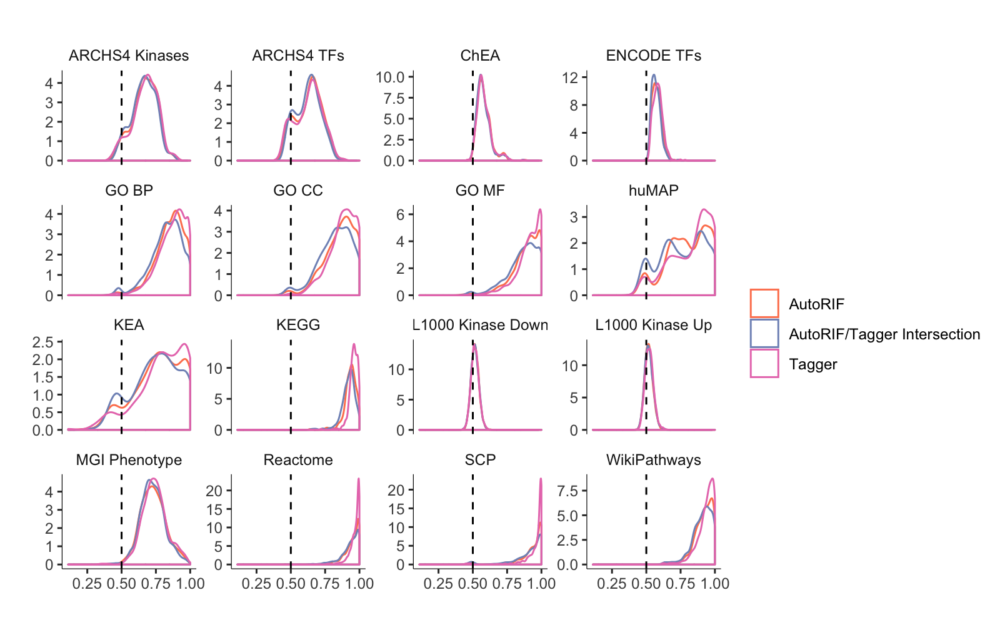

In [418]:
%%R -i s1_plot_dataframe -h 1000 -w 1600 -r 200
#ticks <- seq()
ggplot(s1_plot_dataframe, aes(x=auc, color=distance)) +
geom_density() +
facet_wrap(~library, scales='free_y') +
scale_color_manual(values=c("#fe825d", "#8194c1", "#e87cba")) +
geom_vline(xintercept=0.5, lty=2, width=0.01) +
labs(title = '', x = '', y = '', color = '', fill='Similarity') +
theme_classic() +
theme(axis.title.x = element_text(vjust=-1), axis.title.y = element_text(vjust=2.5), axis.line = element_line(colour = 'black', size=0.2), strip.background = element_rect(color='black', fill='white', size=0))

## 3. Supplementary Figure 2

In [484]:
# Compare individual comparisons between autorif and archs
s2_dataframe = read_auc_scores(['archs', 'autorif_prob'], auc_type='library')
s2_plot_dataframe = s2_dataframe.pivot_table(index=['term_name', 'library'], columns='distance', values='auc').reset_index()
# Rename libraries
for key, value in library_metadata.items():
    s2_plot_dataframe = s2_plot_dataframe.replace(key, value['label'])

In [485]:
s2_plot_dataframe.head()

distance,term_name,library,archs,autorif_prob
0,'de novo' posttranslational protein folding (G...,GO BP,0.765210,0.925679
1,1-acylglycerol-3-phosphate O-acyltransferase a...,GO MF,0.681821,0.875806
2,1-phosphatidylinositol 4-kinase activity (GO:0...,GO MF,0.791206,1.000000
3,1-phosphatidylinositol binding (GO:0005545),GO MF,0.797554,0.773244
4,1-phosphatidylinositol-3-kinase activity (GO:0...,GO MF,0.739656,0.968822


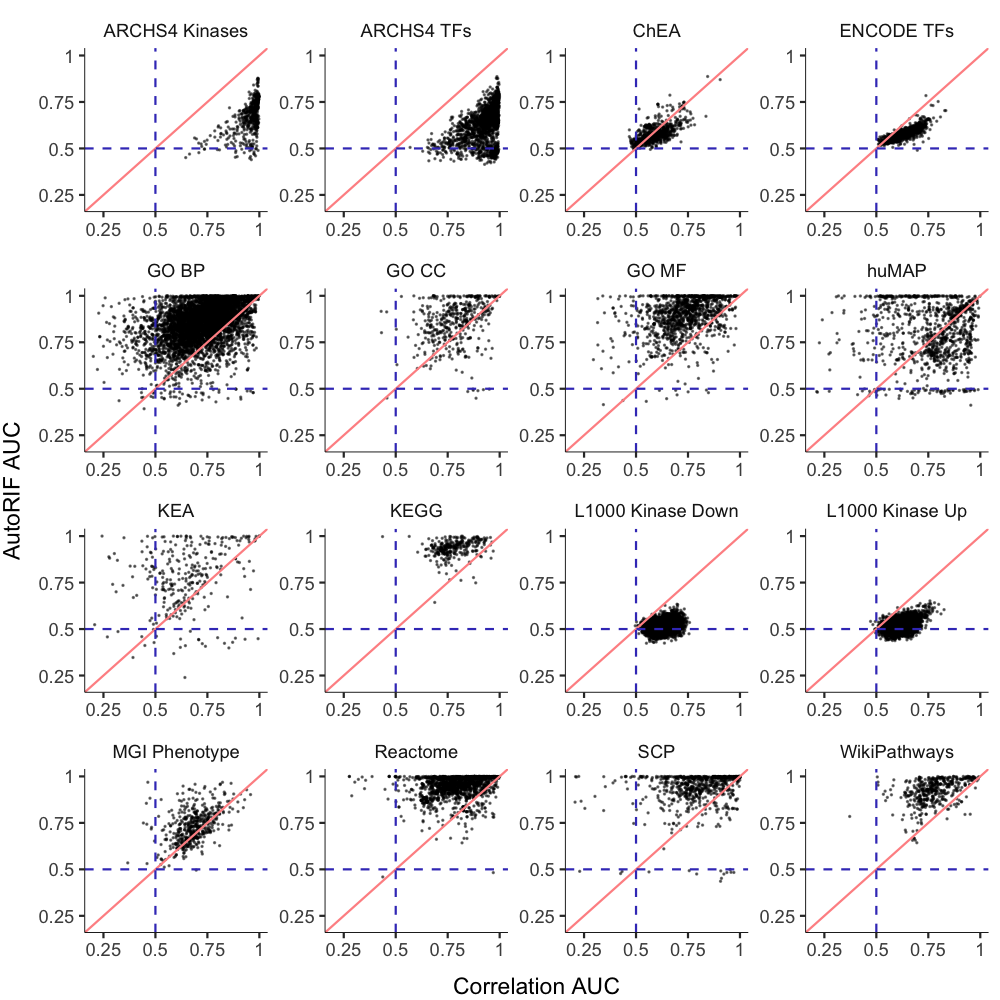

In [517]:
%%R -i s2_plot_dataframe -h 1000 -w 1000 -r 150
lim <- c(0.2, 1)
ticks <- c(0.25, 0.5, 0.75, 1)
gp <- ggplot(s2_plot_dataframe, aes(x=archs, y=autorif_prob)) +
geom_point(alpha=0.5, size=0.1) +
facet_wrap(~library, scales='free') +
geom_abline(intercept=0, slope=1, color='#ff9393') +
geom_vline(xintercept=0.5, lty=2, color='#3f3fc1') +
geom_hline(yintercept=0.5, lty=2, color='#3f3fc1') +
theme_classic() +
scale_x_continuous(lim=lim, breaks=ticks, labels=ticks) + 
scale_y_continuous(lim=lim, breaks=ticks, labels=ticks) + 
xlab('Correlation AUC') + ylab('AutoRIF AUC') +
theme(axis.title.x = element_text(vjust=-1), axis.title.y = element_text(vjust=2.5), axis.line = element_line(colour = 'black', size=0.2), strip.background = element_rect(color='white', fill='white', size=0))
print(gp)
ggsave('./pipeline/plots/archs_vs_autorif.pdf', gp, width=7, height=7);

In [583]:
%R ggsave('./pipeline/plots/archs_vs_autorif.png', gp);

/Users/denis/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

Saving 6.67 x 6.67 in image




In [ ]:
def plot_median_auc(distances, auc_type='library'):
    result_dataframe = read_auc_scores(distances, auc_type)

In [36]:
def plot_auc_scores(distances, auc_type='library'):
    result_dataframe = read_auc_scores(distances, auc_type)
    %R -i result_dataframe,auc_type -h 1000 -w 1600 -r 200 print(ggplot(result_dataframe, aes(x=auc, color=distance)) + geom_density() + facet_wrap(~library, scales='free') + theme_classic() + ggtitle(auc_type) + theme(axis.title.x = element_text(vjust=-1), axis.title.y = element_text(vjust=2.5), axis.line = element_line(colour = 'black', size=0.2), strip.background = element_rect(color='black', fill='white', size=0)));

/Users/denis/anaconda3/lib/python3.6/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning:

from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.



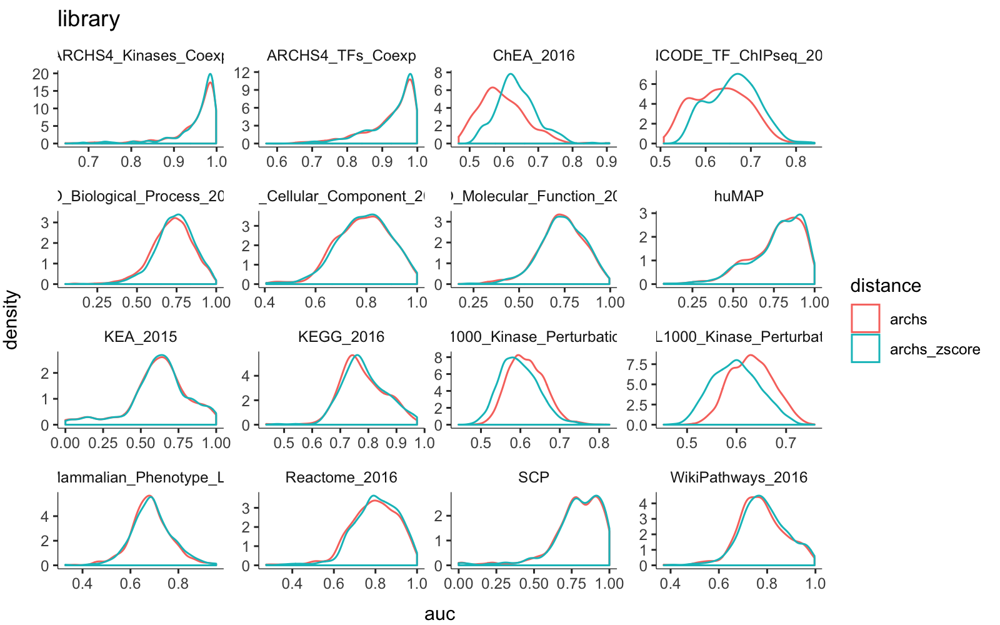

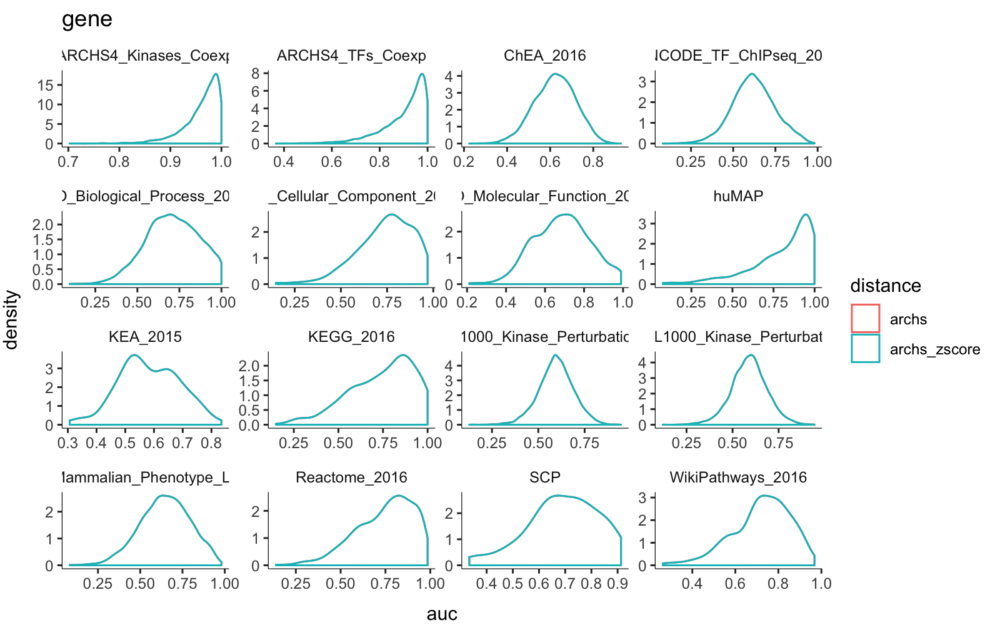

In [42]:
for x in ['archs']:
    for auc_type in ['library', 'gene']:
        plot_auc_scores([x, x+'_zscore'], auc_type)

/Users/denis/anaconda3/lib/python3.6/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning:

from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.



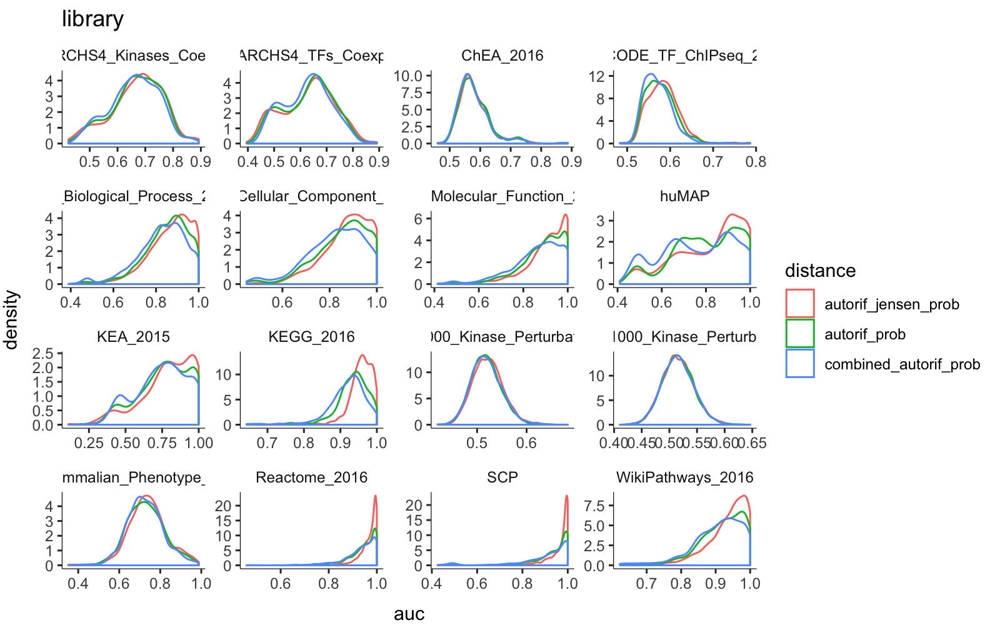

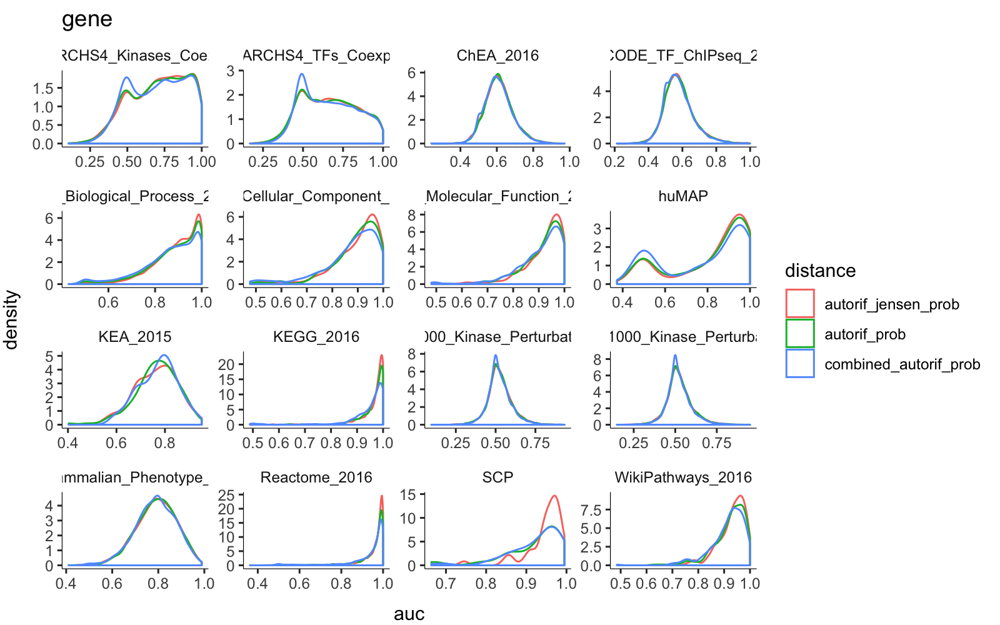

In [286]:
# Supplementary figure
for auc_type in ['library', 'gene']:
    plot_auc_scores(['autorif_jensen_prob', 'autorif_prob', 'combined_autorif_prob'], auc_type)

/Users/denis/anaconda3/lib/python3.6/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning:

from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.



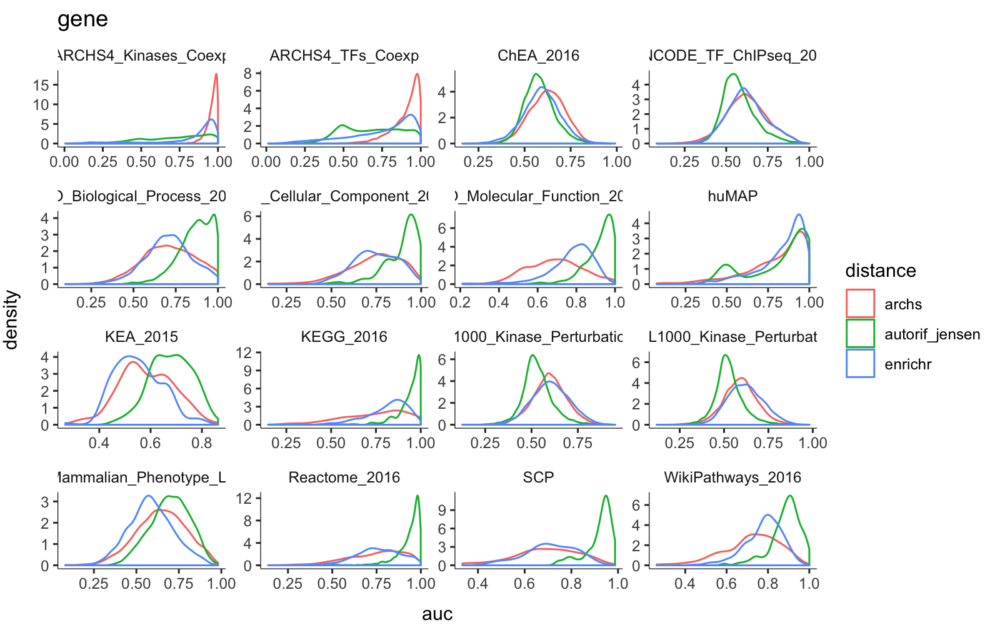

In [44]:
plot_auc_scores(['archs', 'autorif_jensen', 'enrichr'], auc_type)

/Users/denis/anaconda3/lib/python3.6/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning:

from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.



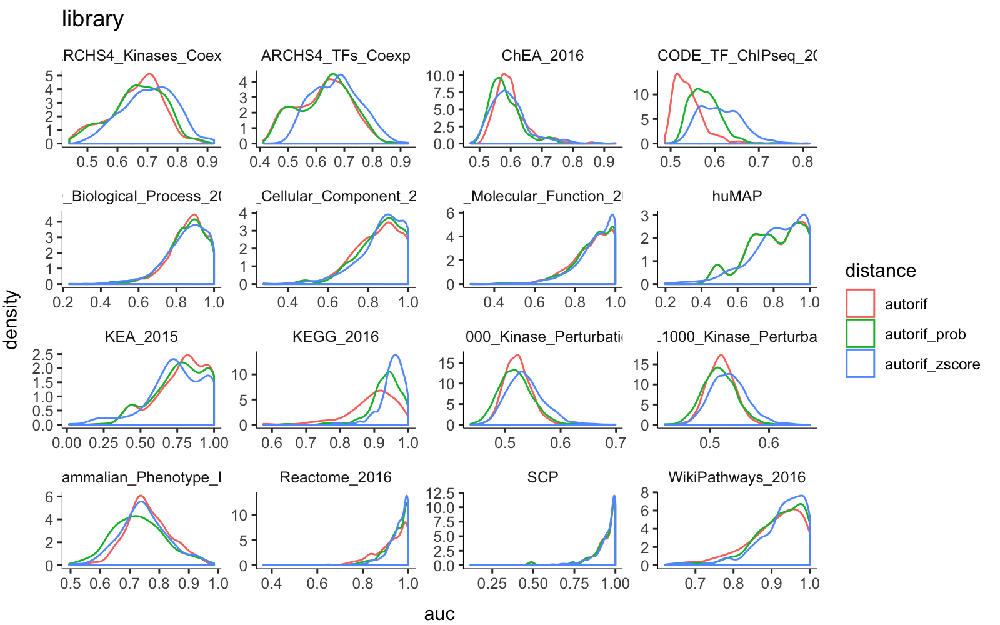

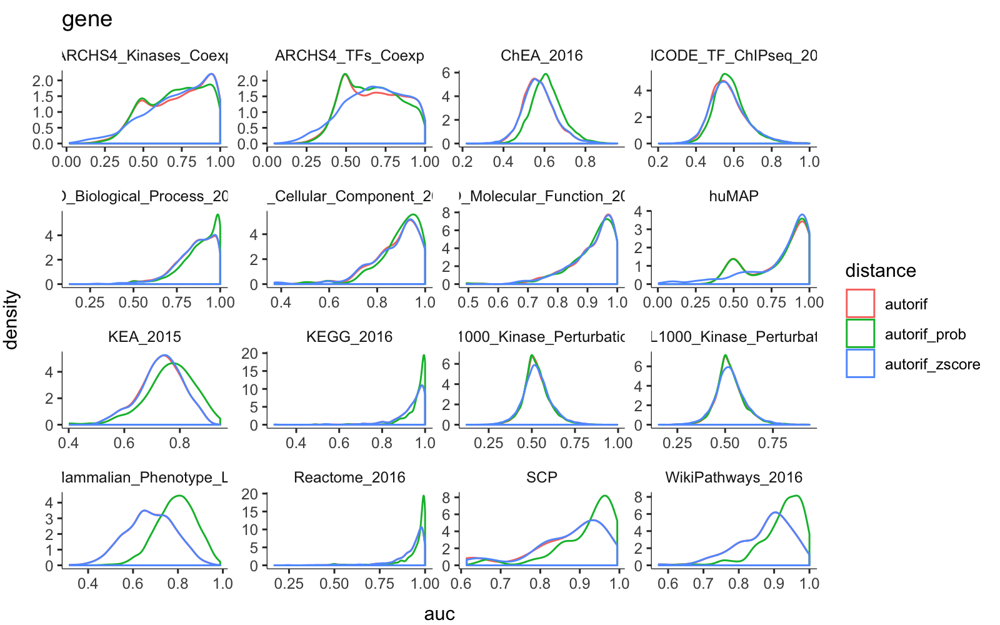

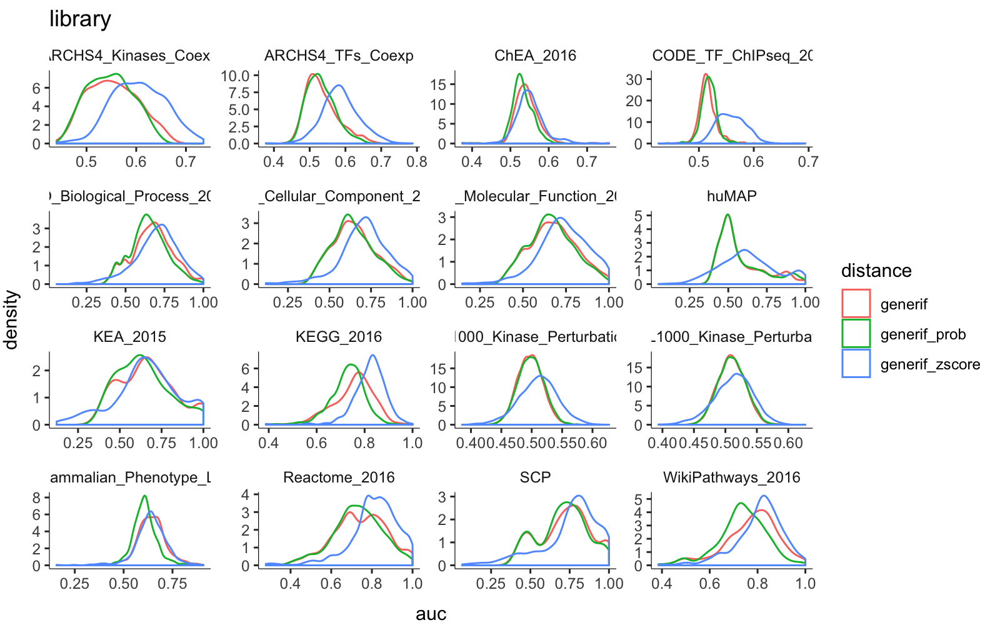

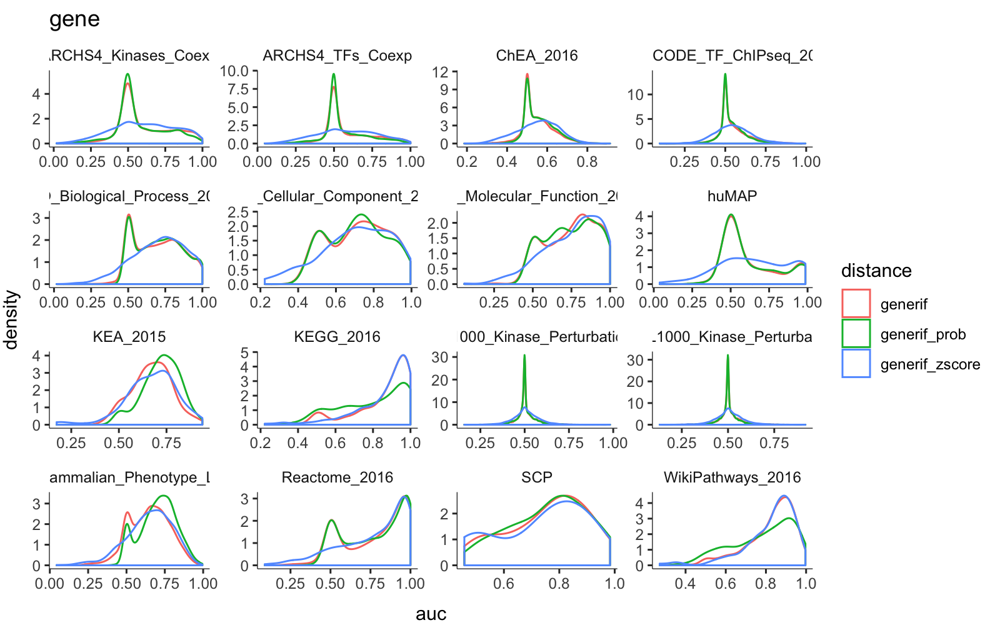

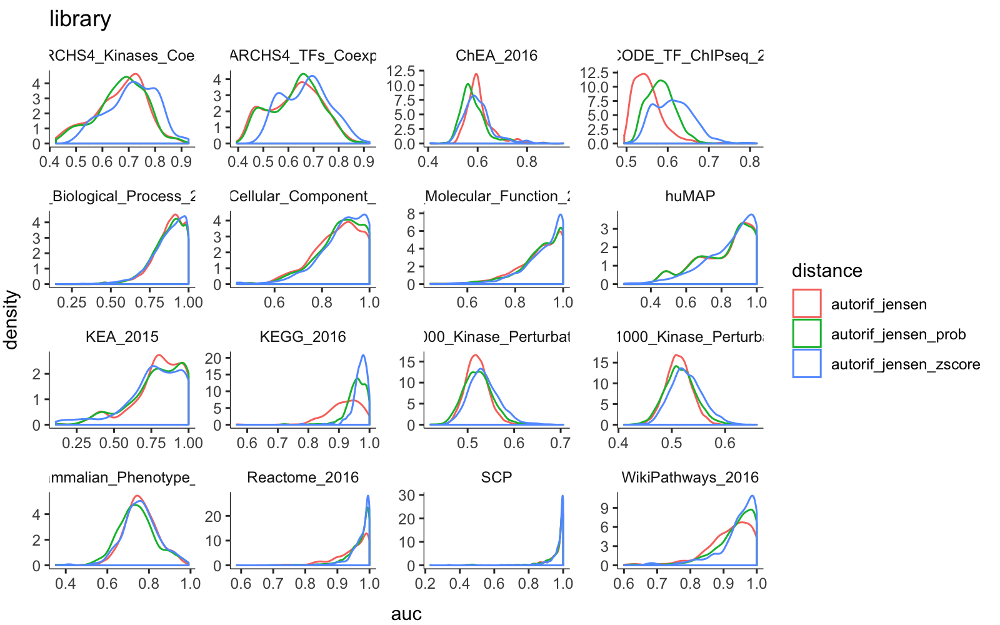

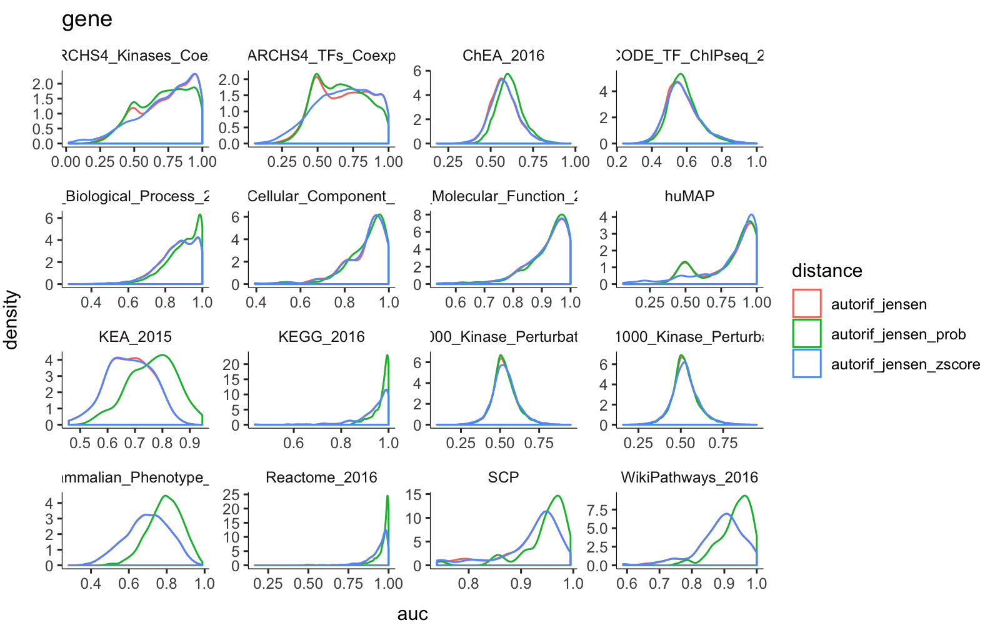

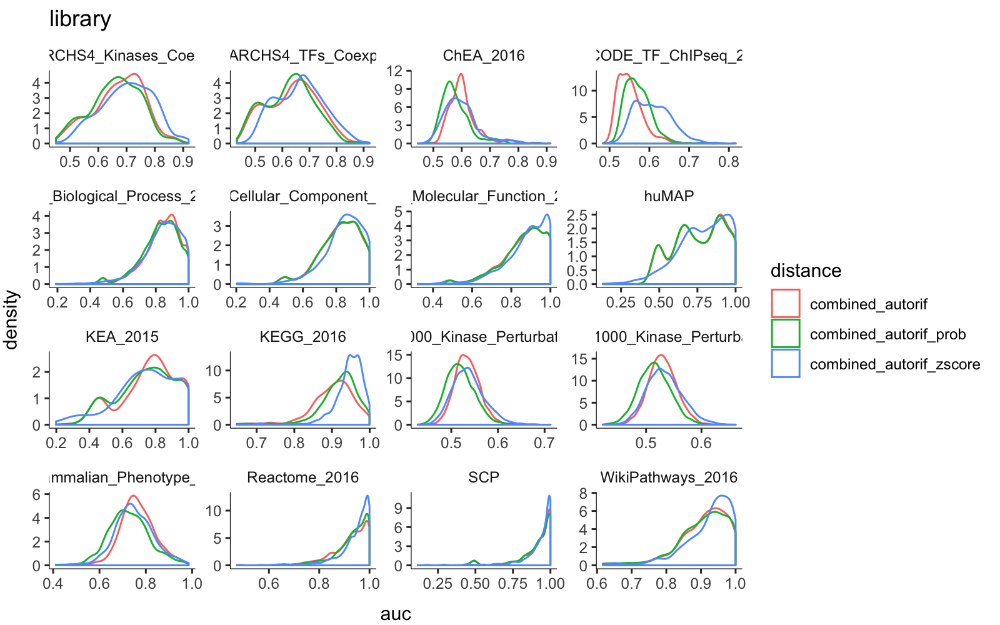

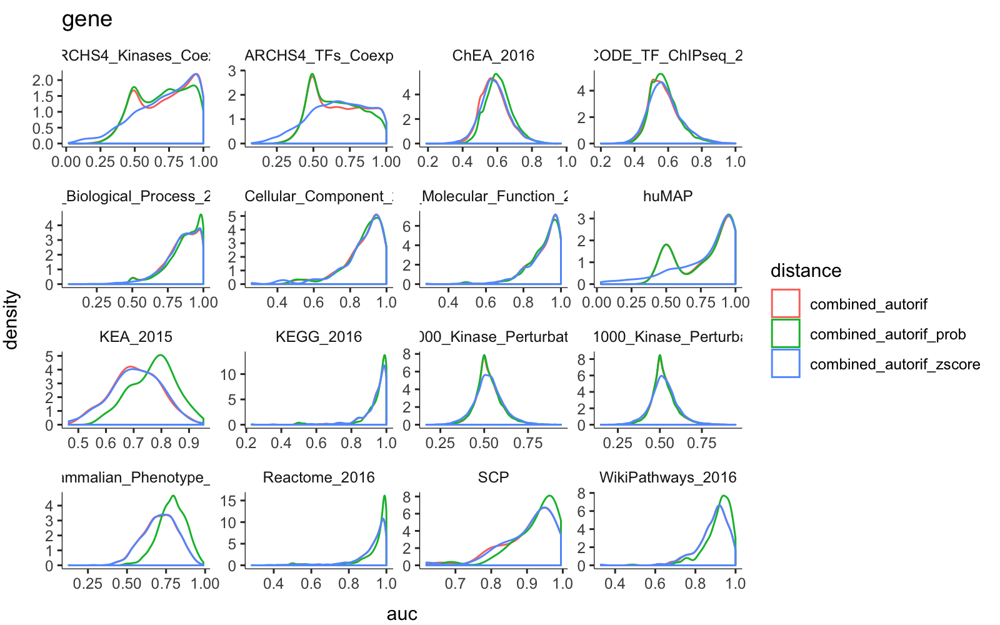

In [39]:
for x in ['autorif', 'generif', 'autorif_jensen', 'combined_autorif']:
    for auc_type in ['library', 'gene']:
        plot_auc_scores([x, x+'_zscore', x+'_prob'], auc_type)

In [40]:
plot_dataframe = read_auc_scores(distances=['autorif_jensen', 'autorif_jensen_zscore', 'autorif_jensen_prob'], auc_type='library')
plot_dataframe.head()

,term_name,auc,distance,library
0,Acetylcholine-mediated control of postsynaptic...,0.999019,autorif_jensen,SCP
1,Acidic keratin dynamics,0.898203,autorif_jensen,SCP
2,Actin filament branching,0.899777,autorif_jensen,SCP
3,Actin filament bundling and crosslinking,0.927758,autorif_jensen,SCP
4,Actin filament capping,0.983783,autorif_jensen,SCP


/Users/denis/anaconda3/lib/python3.6/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning:

from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.



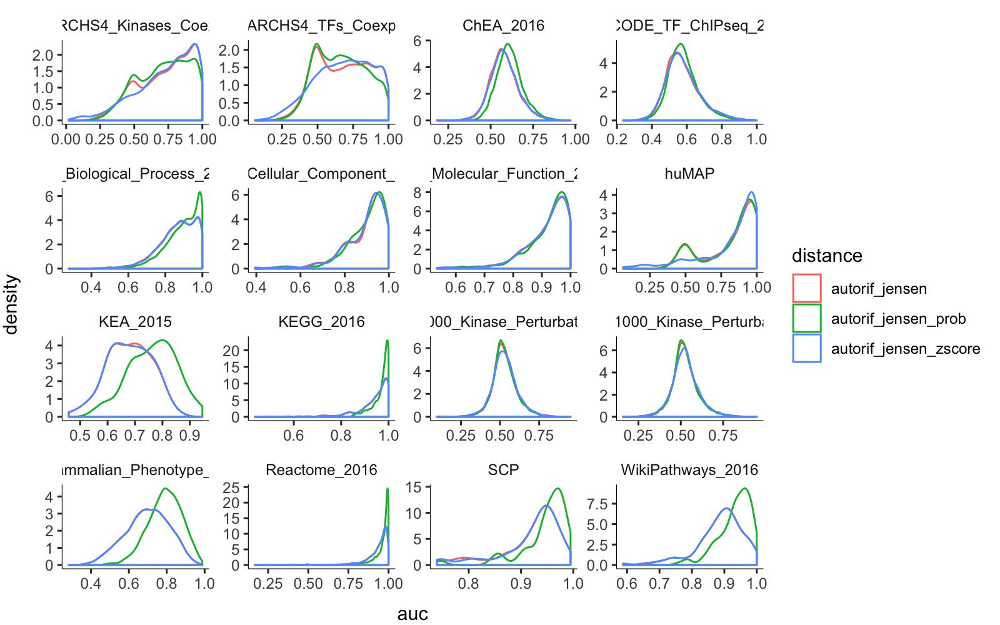

,gene_symbol,auc,distance,library
0,CAPN5,NaN,autorif_jensen,WikiPathways_2016
1,SLC6A16,NaN,autorif_jensen,WikiPathways_2016
2,RPS10,NaN,autorif_jensen,WikiPathways_2016
3,LHX3,NaN,autorif_jensen,WikiPathways_2016
4,NCOA6,NaN,autorif_jensen,WikiPathways_2016


In [27]:
plot_dataframe = read_auc_scores(distances=['autorif_jensen', 'autorif_jensen_zscore', 'autorif_jensen_prob'], auc_type='gene')
plot_dataframe.head()

## Scatter Plots

In [74]:
# Compare individual comparisons between autorif and archs
s3_dataframe = read_auc_scores(['archs', 'autorif_prob', 'autorif_jensen_prob', 'enrichr_prob', 'generif_prob'], auc_type='library')
s3_plot_dataframe = s3_dataframe.pivot_table(index=['term_name', 'library'], columns='distance', values='auc').reset_index()
# Rename libraries
for key, value in library_metadata.items():
    s3_plot_dataframe = s3_plot_dataframe.replace(key, value['label'])
s3_plot_dataframe = s3_plot_dataframe.set_index('term_name').rename(columns={'archs': 'Coexpression', 'autorif_jensen_prob': 'Tagger', 'autorif_prob': 'AutoRIF', 'enrichr_prob': 'Enrichr', 'generif_prob': 'GeneRIF'})
s3_plot_dataframe.head()

distance,library,Coexpression,Tagger,AutoRIF,Enrichr,GeneRIF
gene_symbol,,,,,,
1190002N15RIK,ChEA,NaN,NaN,NaN,NaN,0.528702
1190002N15RIK,ENCODE TFs,NaN,NaN,NaN,NaN,0.526037
1300017J02RIK,ChEA,NaN,NaN,NaN,NaN,0.500000
1300017J02RIK,ENCODE TFs,NaN,NaN,NaN,NaN,0.500000
1700003E16RIK,ChEA,NaN,NaN,NaN,NaN,0.598577


In [75]:
def plot_unity(xdata, ydata, **kwargs):
    mn = 0
    mx = 1
    points = np.linspace(mn, mx, 100)
    plt.gca().plot(points, points, color='k', marker=None,
            linestyle='--', linewidth=1.0)

In [76]:
from matplotlib.backends.backend_pdf import PdfPages


/Users/denis/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:454: RuntimeWarning:

invalid value encountered in greater

/Users/denis/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:454: RuntimeWarning:

invalid value encountered in less

/Users/denis/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



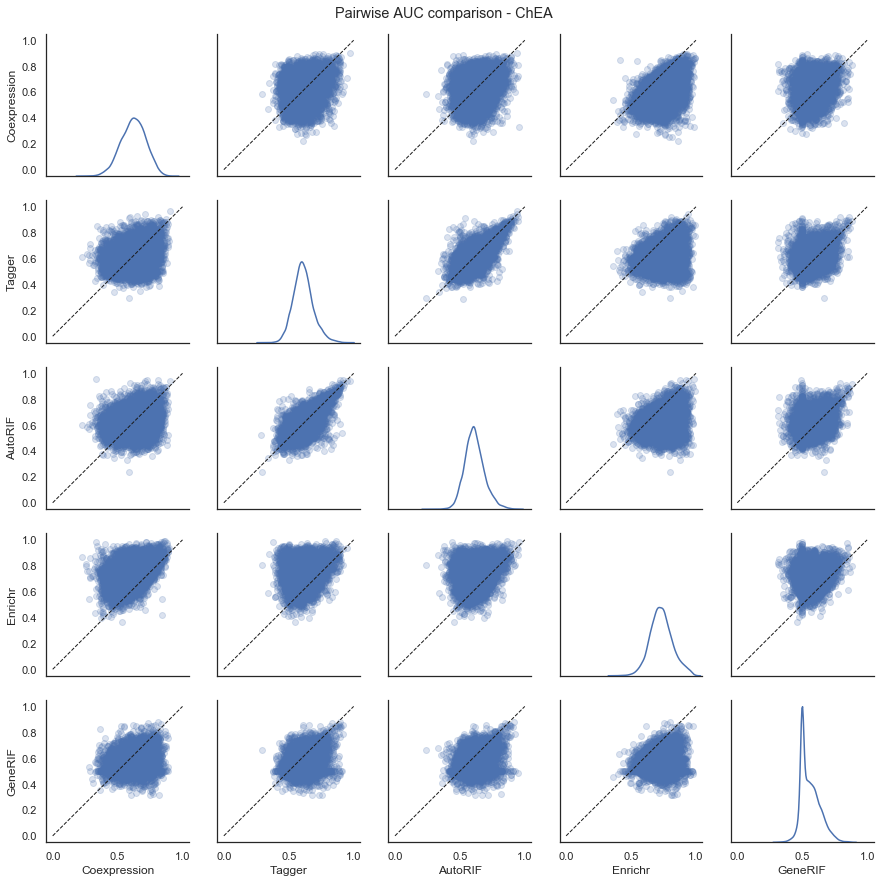

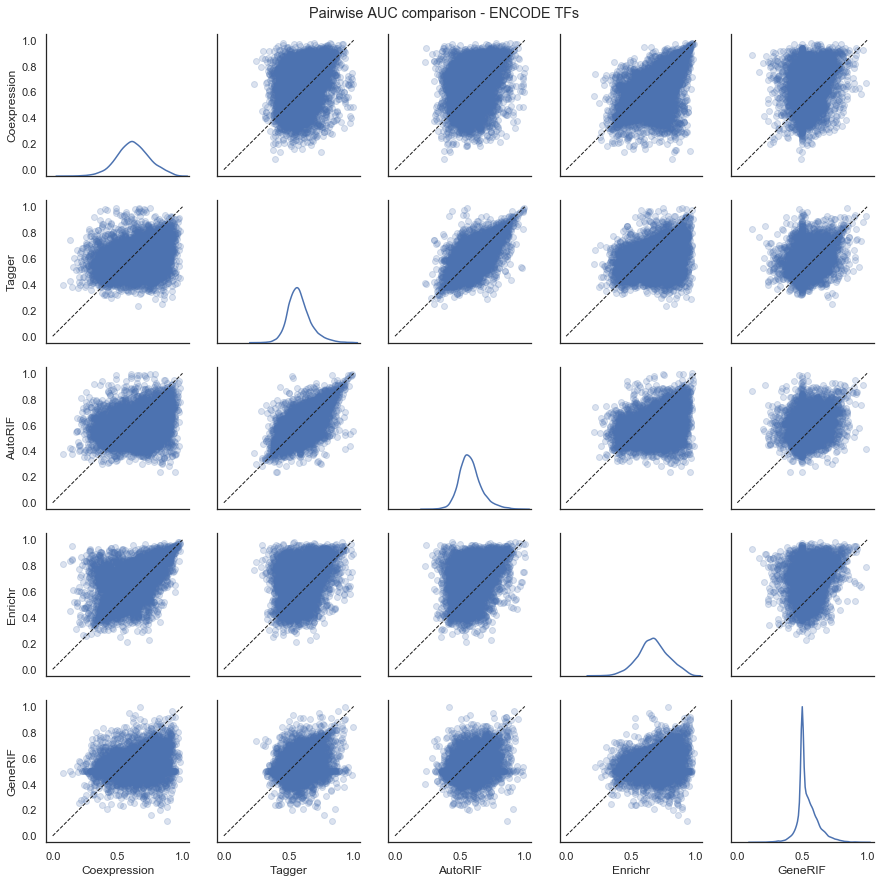

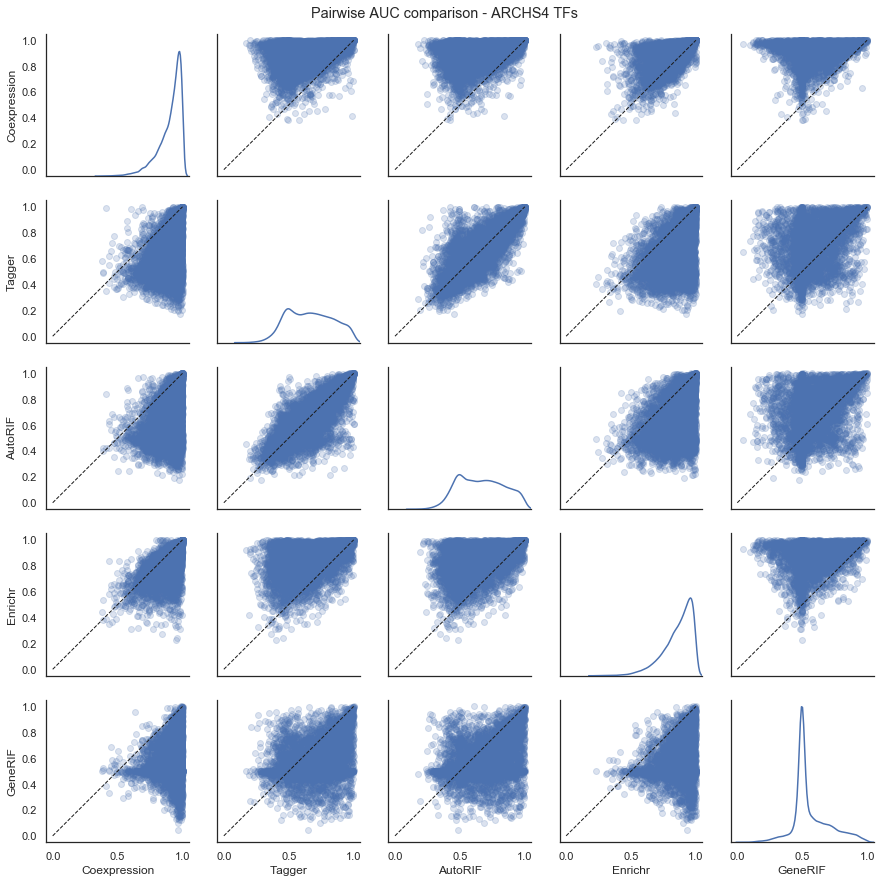

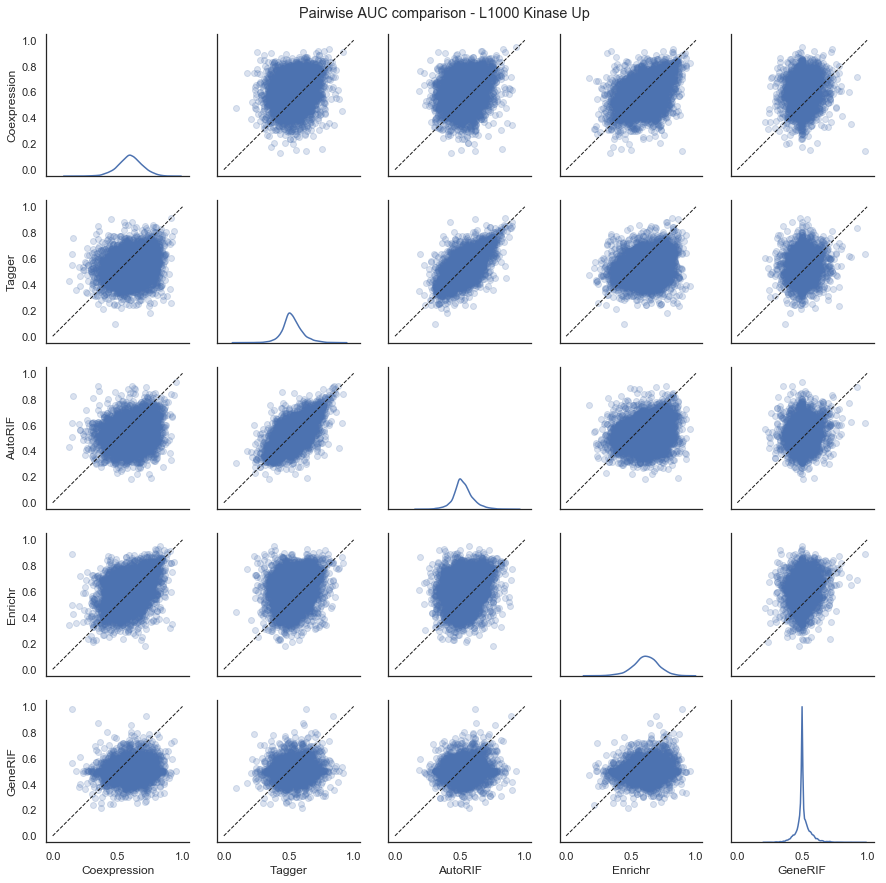

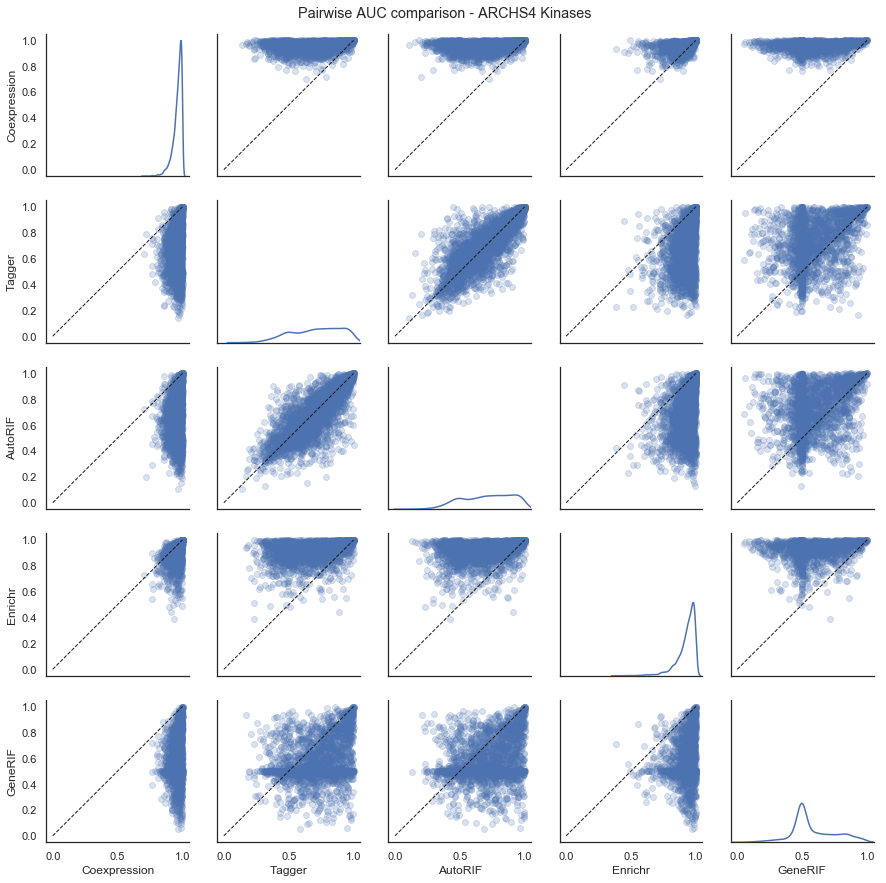

...

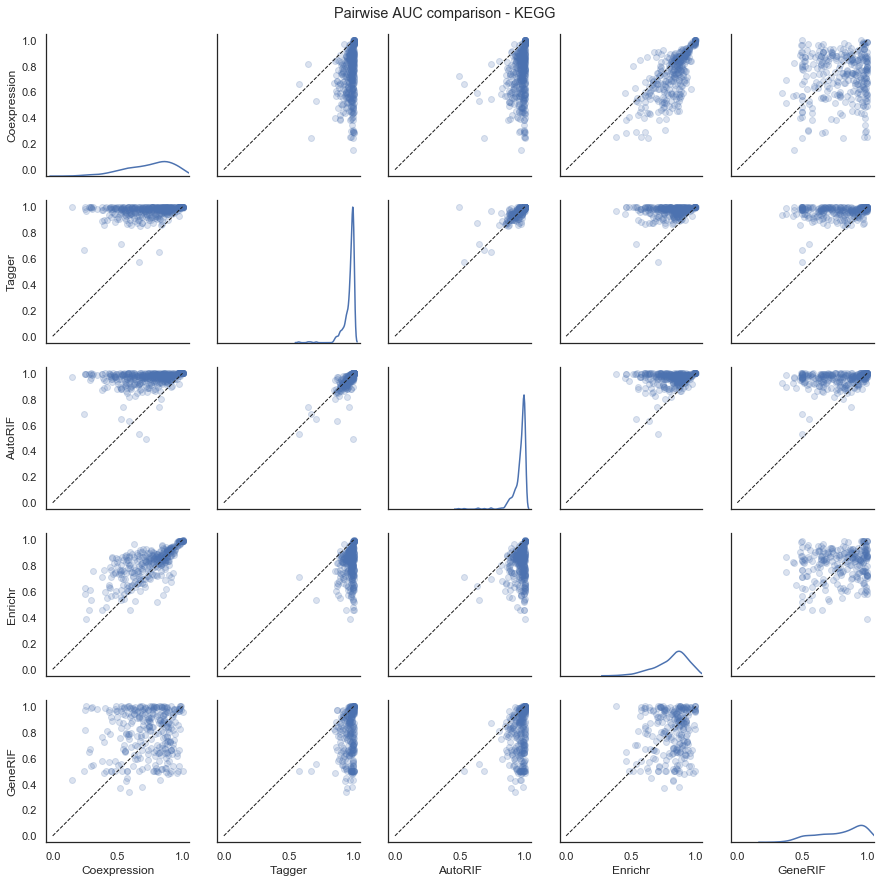

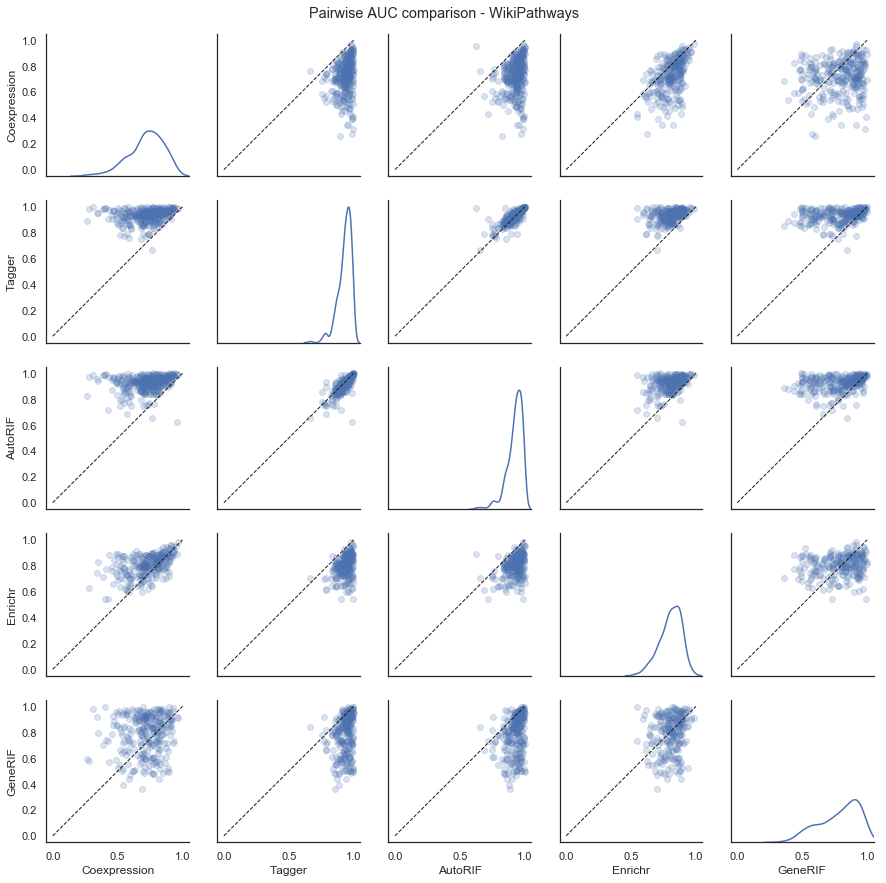

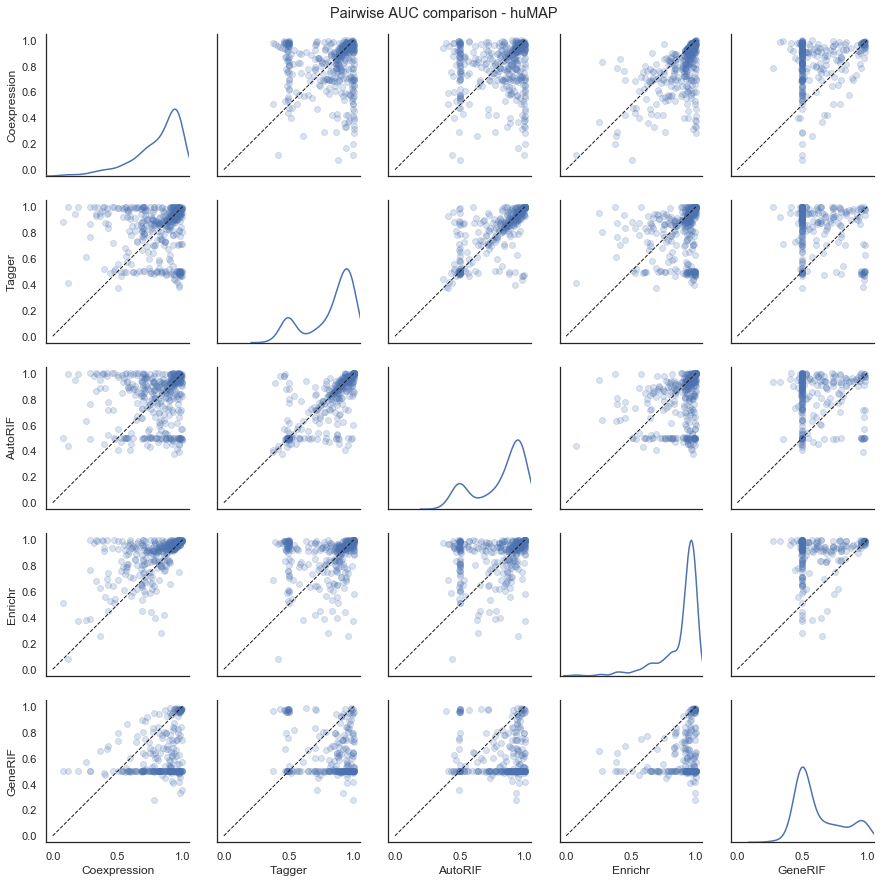

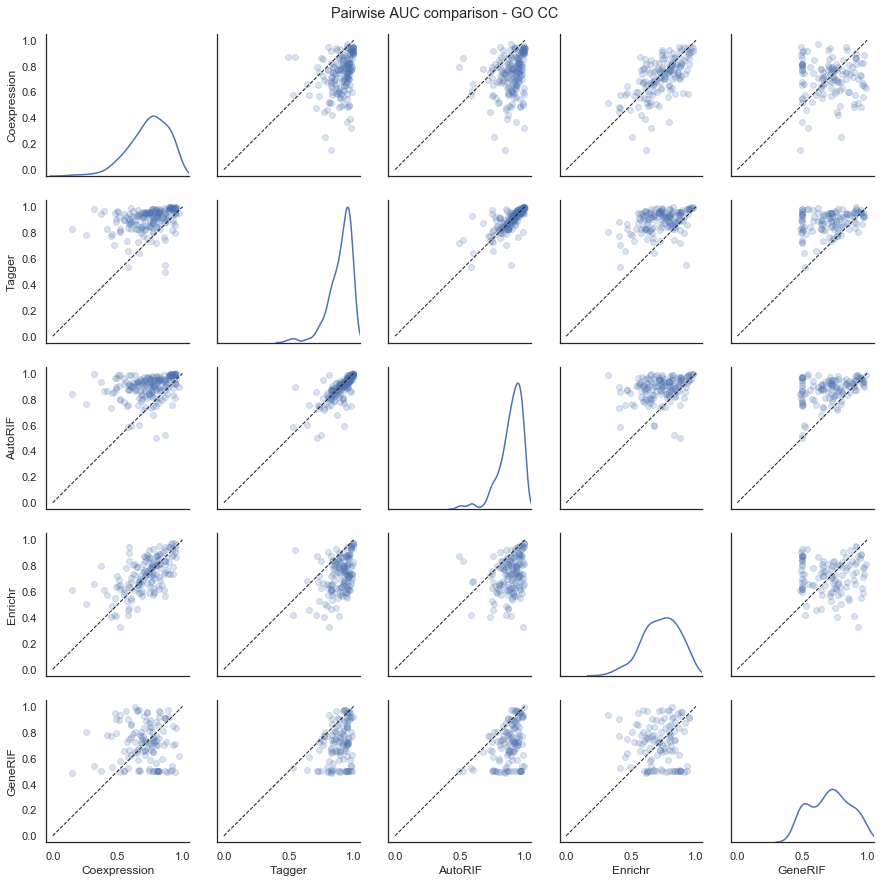

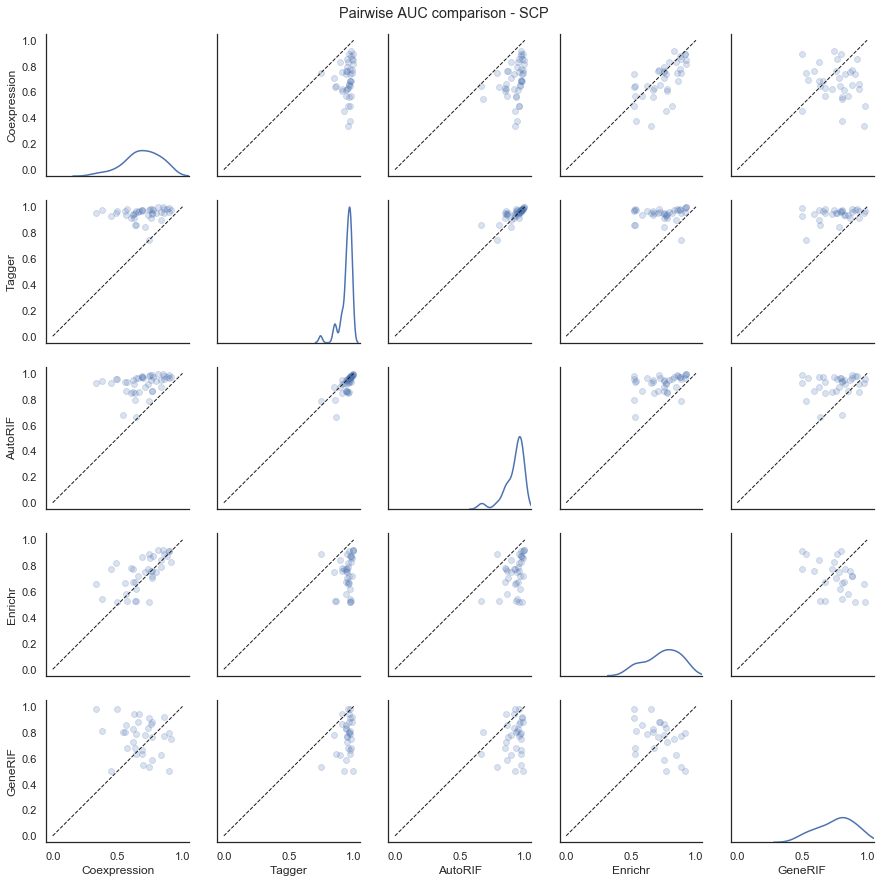

In [77]:
sns.set_style("white");
lim = (-0.05, 1.05)
with PdfPages('./pipeline/plots/pairwise_auc.pdf') as pdf_pages:
    for i, library in enumerate(s3_plot_dataframe['library'].unique()):
        s3_plot_dataframe_subset = s3_plot_dataframe[s3_plot_dataframe['library'] == library].drop('library', axis=1)
        fig = plt.figure(i)
        g = sns.PairGrid(s3_plot_dataframe_subset)
        g = g.map_offdiag(plt.scatter, alpha=0.2)
        g = g.map_offdiag(plot_unity)
        g = g.map_diag(sns.kdeplot)
        g.set(ylim=lim, xlim=lim)
        plt.subplots_adjust(top=0.95)
        plt.suptitle('Pairwise AUC comparison - '+library)
        pdf_pages.savefig(g.fig)

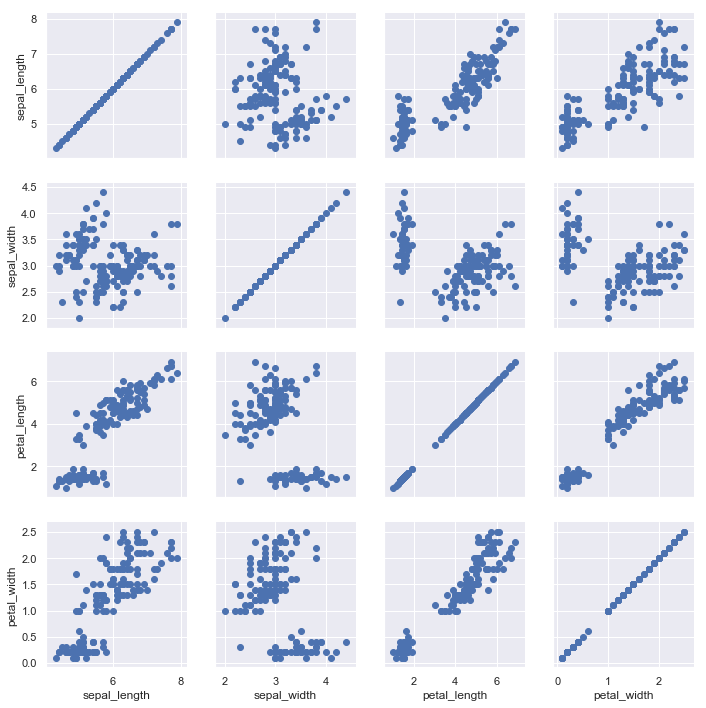

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
iris = sns.load_dataset("iris")
g = sns.PairGrid(iris)
g = g.map(plt.scatter)

In [ ]:
%%R -i plot_dataframe